<a href="https://colab.research.google.com/github/YDayoub/DCGANs-animefaces/blob/main/DCGANs.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Deep Convolutional GAN (DCGAN)

In [1]:
import torch
from torch import nn
from tqdm.auto import tqdm
from torchvision.utils import make_grid
from torchvision.datasets import MNIST
from torch.utils.data import Dataset
from torchvision import transforms
import matplotlib
from matplotlib import pyplot as plt
import numpy as np
from torchsummary import summary
import os
import urllib
import zipfile
from skimage import io
import warnings
warnings.filterwarnings("ignore")
%matplotlib inline
def show_tensor_images(imgs,img_nums=25,shape=(3,64,64)):
  imgs = imgs[:img_nums].detach().to('cpu')
  imgs = (imgs+1)/2
  imgs = imgs.view((-1,*shape))
  imgs_grid = make_grid(imgs,nrow=5)
  plt.imshow(imgs_grid.permute(1, 2, 0).squeeze())
  plt.axis('off')
  plt.show()
device = 'cuda' if torch.cuda.is_available() else 'cpu'
device

'cuda'

In [2]:
# generator class
from functools import reduce
from operator import __add__
def mk_generator_blk(in_channels,out_channels,kernel_size=4,stride=2,padding=0,final_layer=False,use_upsampling=False,starting_size = None):
 
  if use_upsampling:
    kernel_sizes = (kernel_size,kernel_size)
    conv_padding = reduce(__add__, 
    [(k // 2 + (k - 2 * (k // 2)) - 1, k // 2) for k in kernel_sizes[::-1]])
    scale = nn.Sequential(
        nn.Upsample((starting_size, starting_size), mode='nearest'),
        nn.ZeroPad2d(conv_padding),
        nn.Conv2d(in_channels, out_channels, kernel_size, padding=0)
    )
           
  else:
    scale = nn.ConvTranspose2d(in_channels,out_channels,kernel_size,stride,padding)
  if final_layer:
    return nn.Sequential(scale,nn.Tanh())
  else:
    return nn.Sequential(scale,nn.BatchNorm2d(num_features=out_channels), nn.LeakyReLU(negative_slope=0.2))


class Generator(nn.Module):
  def __init__(self,im_channel,z_dims,hidden_dims,use_upsampling=False):
    super(Generator, self).__init__()
    self.im_channel = im_channel
    self.z_dims = z_dims
    self.gen = nn.Sequential(
        mk_generator_blk(z_dims,4*hidden_dims,use_upsampling=use_upsampling,starting_size=4),
        mk_generator_blk(4*hidden_dims,2*hidden_dims,kernel_size=4,stride=2,use_upsampling=use_upsampling,starting_size=16),
        mk_generator_blk(2*hidden_dims,hidden_dims,use_upsampling=use_upsampling,kernel_size=3,starting_size=32),
        mk_generator_blk(hidden_dims,im_channel,stride =3,kernel_size=4,use_upsampling=use_upsampling,final_layer=True,starting_size=64)
        
    )
  def forward(self,x):
    return self.gen(x)

   
def getNoise(shape,device):
  z = torch.randn(shape,device = device)
  return z


In [3]:
def mk_discriminator_blk(input_channels,output_channels,kernel_size=4,stride=2,final_layer=False):
  if not final_layer:
            return nn.Sequential(
               
                nn.Conv2d(in_channels=input_channels,out_channels=output_channels,
                         kernel_size=kernel_size,stride = stride),
                nn.BatchNorm2d(num_features = output_channels),
                nn.LeakyReLU(negative_slope=0.2)            )
  else: # Final Layer
      return nn.Sequential(
        
          nn.Conv2d(in_channels=input_channels,out_channels=output_channels,
                    kernel_size=kernel_size,stride = stride)
      )

class Discrminator(nn.Module):
  def __init__(self,hidden_dims):
    super(Discrminator, self).__init__()
    
    self.disc = nn.Sequential(
        mk_discriminator_blk(im_channel,hidden_dims,kernel_size=6,stride=3),
        mk_discriminator_blk(hidden_dims,2*hidden_dims,kernel_size=6,stride=3),
        mk_discriminator_blk(2*hidden_dims,1,final_layer=True)
            )
  def forward(self,x):
    res = self.disc(x)
    return res.view(x.shape[0],-1)


In [4]:
z_dims = 512
batch_size=64
hidden_dims = 128
im_channel=3
display_step = 500
lr = 0.0002
beta_1 = 0.5 
beta_2 = 0.999
n_epochs = 10
img_size = 64
save_model = False


In [5]:
gen = Generator(im_channel=im_channel,z_dims=z_dims,hidden_dims=hidden_dims).to(device)
summary(gen,(z_dims,1,1))

----------------------------------------------------------------
        Layer (type)               Output Shape         Param #
   ConvTranspose2d-1            [-1, 512, 4, 4]       4,194,816
       BatchNorm2d-2            [-1, 512, 4, 4]           1,024
         LeakyReLU-3            [-1, 512, 4, 4]               0
   ConvTranspose2d-4          [-1, 256, 10, 10]       2,097,408
       BatchNorm2d-5          [-1, 256, 10, 10]             512
         LeakyReLU-6          [-1, 256, 10, 10]               0
   ConvTranspose2d-7          [-1, 128, 21, 21]         295,040
       BatchNorm2d-8          [-1, 128, 21, 21]             256
         LeakyReLU-9          [-1, 128, 21, 21]               0
  ConvTranspose2d-10            [-1, 3, 64, 64]           6,147
             Tanh-11            [-1, 3, 64, 64]               0
Total params: 6,595,203
Trainable params: 6,595,203
Non-trainable params: 0
----------------------------------------------------------------
Input size (MB): 0.00
Forw

In [6]:
disc = Discrminator(hidden_dims=hidden_dims).to(device)
summary(disc,(3,64,64))

----------------------------------------------------------------
        Layer (type)               Output Shape         Param #
            Conv2d-1          [-1, 128, 20, 20]          13,952
       BatchNorm2d-2          [-1, 128, 20, 20]             256
         LeakyReLU-3          [-1, 128, 20, 20]               0
            Conv2d-4            [-1, 256, 5, 5]       1,179,904
       BatchNorm2d-5            [-1, 256, 5, 5]             512
         LeakyReLU-6            [-1, 256, 5, 5]               0
            Conv2d-7              [-1, 1, 1, 1]           4,097
Total params: 1,198,721
Trainable params: 1,198,721
Non-trainable params: 0
----------------------------------------------------------------
Input size (MB): 0.05
Forward/backward pass size (MB): 1.32
Params size (MB): 4.57
Estimated Total Size (MB): 5.94
----------------------------------------------------------------


In [7]:
def weights_init(m):
    if isinstance(m, nn.Conv2d) or isinstance(m, nn.ConvTranspose2d):
        torch.nn.init.normal_(m.weight, 0.0, 0.02)
    if isinstance(m, nn.BatchNorm2d):
        torch.nn.init.normal_(m.weight, 0.0, 0.02)
        torch.nn.init.constant_(m.bias, 0)
gen = gen.apply(weights_init)
disc = disc.apply(weights_init)
gen_opt = torch.optim.Adam(gen.parameters(),lr=lr,betas=(beta_1,beta_2))
disc_opt = torch.optim.Adam(disc.parameters(),lr=lr,betas=(beta_1,beta_2))
criterion = torch.nn.BCEWithLogitsLoss()


In [8]:
try:
  os.mkdir('/content/anime')
except OSError:
  pass

# download the zipped dataset to the data directory
data_url = "https://storage.googleapis.com/laurencemoroney-blog.appspot.com/Resources/anime-faces.zip"
data_file_name = "animefaces.zip"
download_dir = '/content/anime/'
urllib.request.urlretrieve(data_url, data_file_name)

# extract the zip file
zip_ref = zipfile.ZipFile(data_file_name, 'r')
zip_ref.extractall(download_dir)
zip_ref.close()

In [9]:
transform = transforms.Compose([
    transforms.ToTensor(),
    transforms.Resize([img_size,img_size]),
    transforms.Normalize([0.5, 0.5, 0.5], [0.5, 0.5, 0.5]),
])

In [10]:
import glob
class animeDataset(Dataset):
  def __init__(self,image_dir,transform=None):
    self.image_files = glob.glob(image_dir+'/*.jpg')
    self.transform = transform
  def __len__(self):
    return len(self.image_files)
  def __getitem__(self,idx):
    sample = io.imread(self.image_files[idx])
    if self.transform:
      sample = self.transform(sample)
    return sample
anime_dataset = animeDataset('/content/anime/images',transform=transform)

In [11]:
dataloader = torch.utils.data.DataLoader(anime_dataset, batch_size=batch_size,
                        shuffle=True, num_workers=2)

  0%|          | 0/994 [00:00<?, ?it/s]

Epoch 1- Step 500: Generator loss: 0.9206041608005757, discriminator loss: 0.08161062633991245


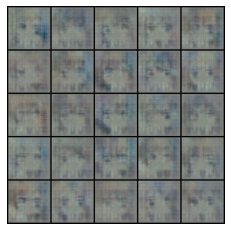

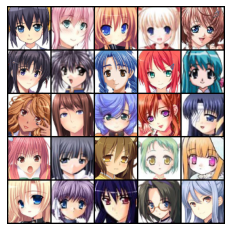

  0%|          | 0/994 [00:00<?, ?it/s]

Epoch 2- Step 1000: Generator loss: 0.6328703572079544, discriminator loss: 0.17044042664766312


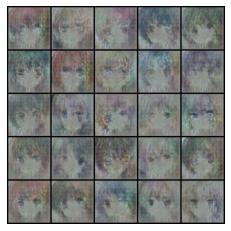

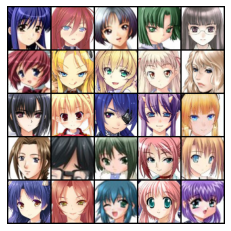

Epoch 2- Step 1500: Generator loss: 0.4954115321263669, discriminator loss: 0.1920720336735249


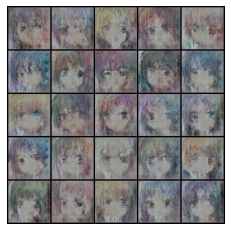

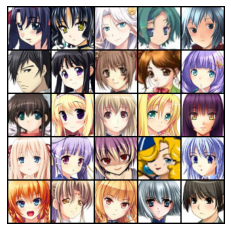

  0%|          | 0/994 [00:00<?, ?it/s]

Epoch 3- Step 2000: Generator loss: 0.4678629218861464, discriminator loss: 0.1921545135676861


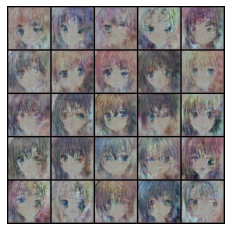

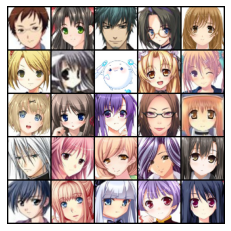

Epoch 3- Step 2500: Generator loss: 0.4794956864044067, discriminator loss: 0.1915834965109826


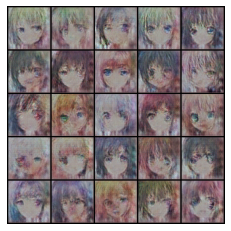

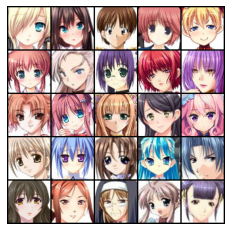

  0%|          | 0/994 [00:00<?, ?it/s]

Epoch 4- Step 3000: Generator loss: 0.48743907800316816, discriminator loss: 0.18471639940142637


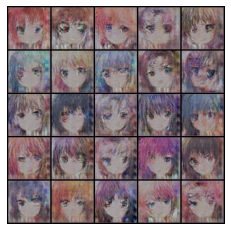

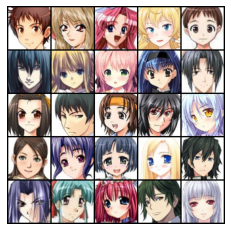

Epoch 4- Step 3500: Generator loss: 0.468108638808131, discriminator loss: 0.20219932836294155


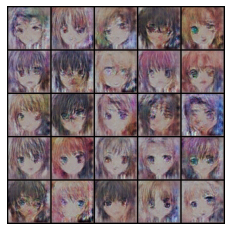

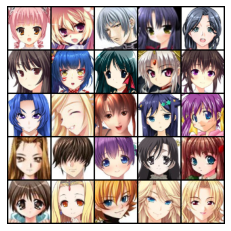

  0%|          | 0/994 [00:00<?, ?it/s]

Epoch 5- Step 4000: Generator loss: 0.4493781862407927, discriminator loss: 0.20582898899912835


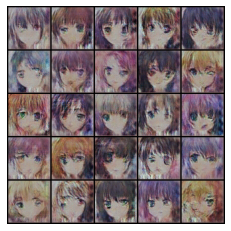

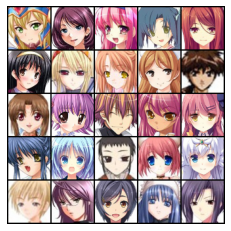

Epoch 5- Step 4500: Generator loss: 0.44702850235998626, discriminator loss: 0.20633378523588194


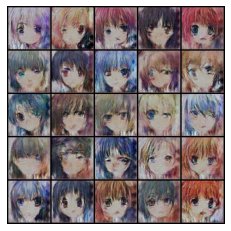

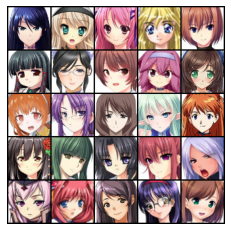

  0%|          | 0/994 [00:00<?, ?it/s]

Epoch 6- Step 5000: Generator loss: 0.4355939020551741, discriminator loss: 0.21088210794329615


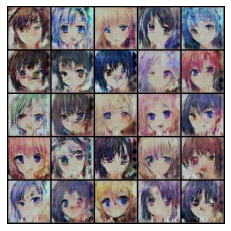

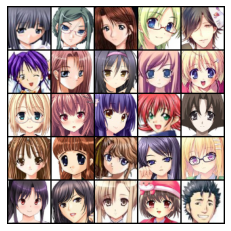

Epoch 6- Step 5500: Generator loss: 0.42028598515689336, discriminator loss: 0.2164717573225499


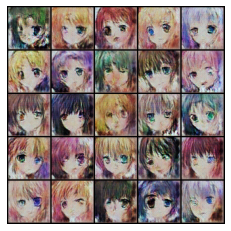

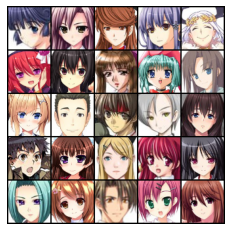

  0%|          | 0/994 [00:00<?, ?it/s]

Epoch 7- Step 6000: Generator loss: 0.4045925302878024, discriminator loss: 0.22004519987106308


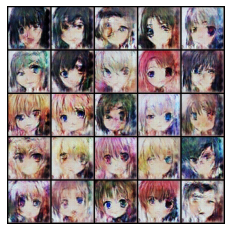

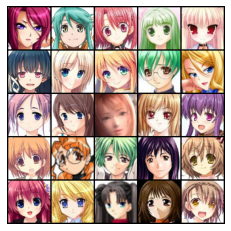

Epoch 7- Step 6500: Generator loss: 0.39294843365251986, discriminator loss: 0.22671720436215406


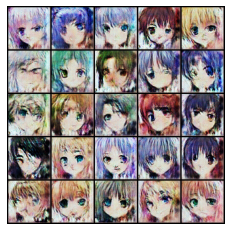

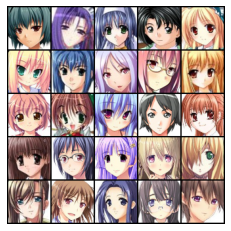

  0%|          | 0/994 [00:00<?, ?it/s]

Epoch 8- Step 7000: Generator loss: 0.3781308817267416, discriminator loss: 0.2313804766833781


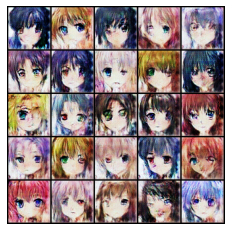

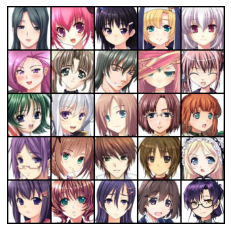

Epoch 8- Step 7500: Generator loss: 0.3698324111253022, discriminator loss: 0.23236690548062325


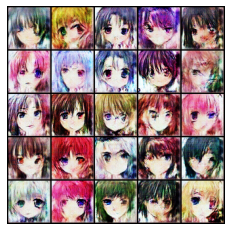

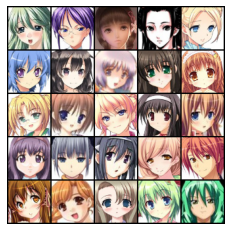

  0%|          | 0/994 [00:00<?, ?it/s]

Epoch 9- Step 8000: Generator loss: 0.36397975572943714, discriminator loss: 0.23400576609373108


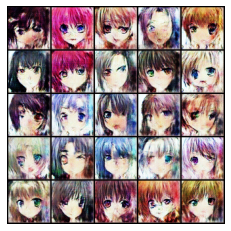

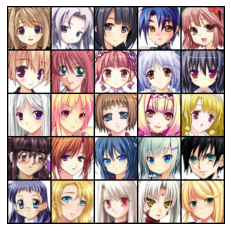

Epoch 9- Step 8500: Generator loss: 0.364411731481552, discriminator loss: 0.23455683156847962


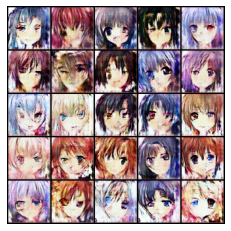

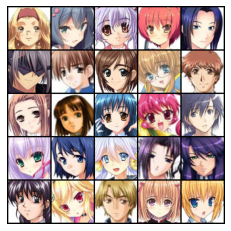

  0%|          | 0/994 [00:00<?, ?it/s]

Epoch 10- Step 9000: Generator loss: 0.3617242935597899, discriminator loss: 0.23451852601766582


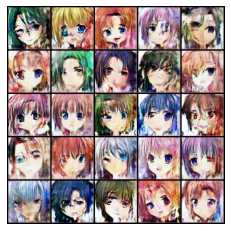

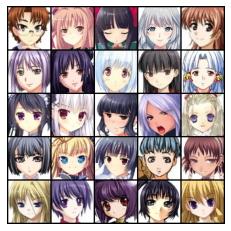

Epoch 10- Step 9500: Generator loss: 0.3633554429113868, discriminator loss: 0.23228811115026493


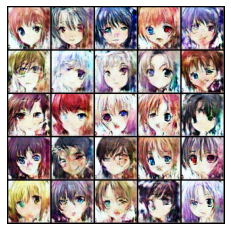

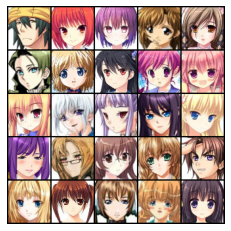

  0%|          | 0/994 [00:00<?, ?it/s]

Epoch 11- Step 10000: Generator loss: 0.36130211809277524, discriminator loss: 0.2320324739813806


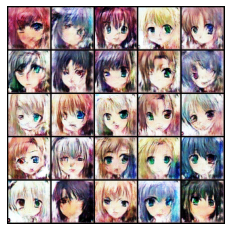

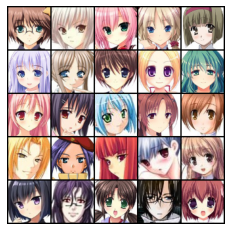

Epoch 11- Step 10500: Generator loss: 0.3641497125029564, discriminator loss: 0.2317148484885692


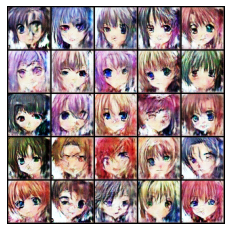

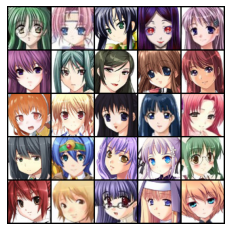

  0%|          | 0/994 [00:00<?, ?it/s]

Epoch 12- Step 11000: Generator loss: 0.3688432323336603, discriminator loss: 0.22952995929121986


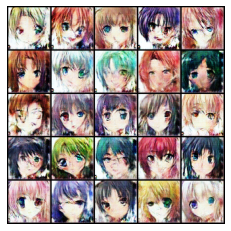

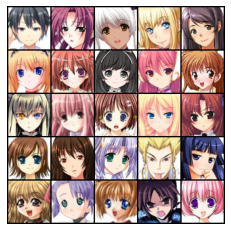

Epoch 12- Step 11500: Generator loss: 0.3707839296162126, discriminator loss: 0.22902178657054909


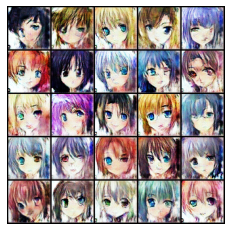

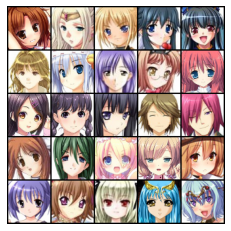

  0%|          | 0/994 [00:00<?, ?it/s]

Epoch 13- Step 12000: Generator loss: 0.36558242316544043, discriminator loss: 0.228819657534361


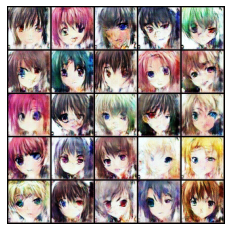

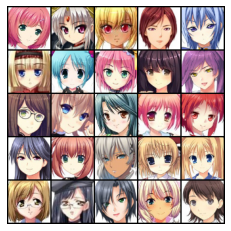

Epoch 13- Step 12500: Generator loss: 0.36863504543900466, discriminator loss: 0.22728009644150726


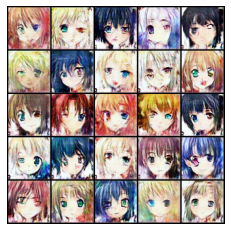

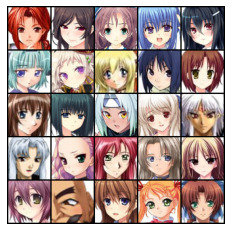

  0%|          | 0/994 [00:00<?, ?it/s]

Epoch 14- Step 13000: Generator loss: 0.3745497169643642, discriminator loss: 0.22618301388621337


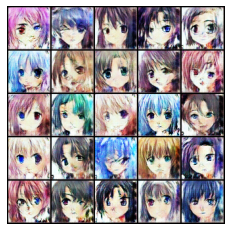

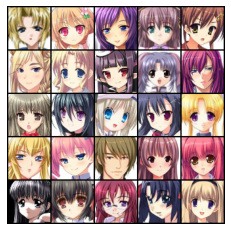

Epoch 14- Step 13500: Generator loss: 0.3756515552252529, discriminator loss: 0.22543550953268995


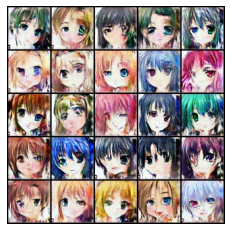

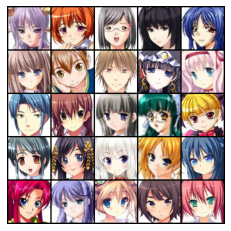

  0%|          | 0/994 [00:00<?, ?it/s]

Epoch 15- Step 14000: Generator loss: 0.37350853590667227, discriminator loss: 0.22589182132482527


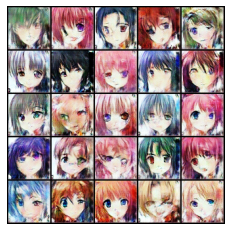

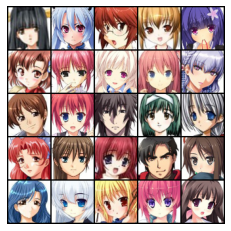

Epoch 15- Step 14500: Generator loss: 0.3819631569981577, discriminator loss: 0.22184398475289346


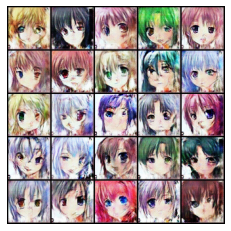

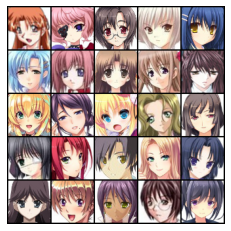

  0%|          | 0/994 [00:00<?, ?it/s]

Epoch 16- Step 15000: Generator loss: 0.37637705229222757, discriminator loss: 0.22279405435919764


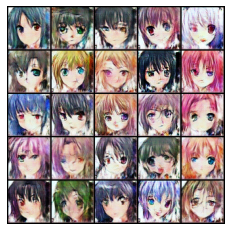

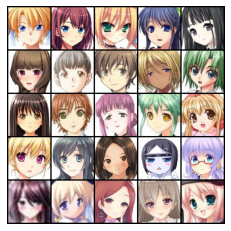

Epoch 16- Step 15500: Generator loss: 0.38479912933707233, discriminator loss: 0.221234240204096


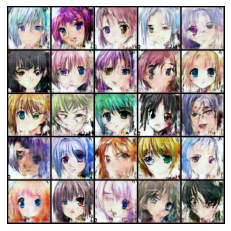

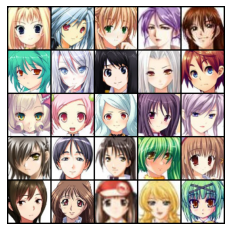

  0%|          | 0/994 [00:00<?, ?it/s]

Epoch 17- Step 16000: Generator loss: 0.3840545904859901, discriminator loss: 0.2216071597337722


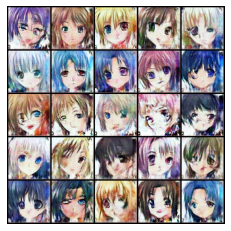

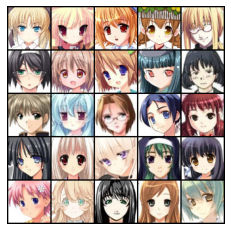

Epoch 17- Step 16500: Generator loss: 0.384788617193699, discriminator loss: 0.2186009099781513


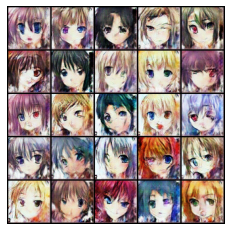

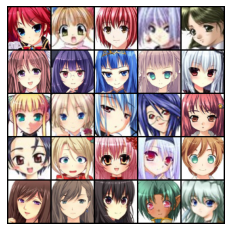

  0%|          | 0/994 [00:00<?, ?it/s]

Epoch 18- Step 17000: Generator loss: 0.38863920135796076, discriminator loss: 0.21850875088572488


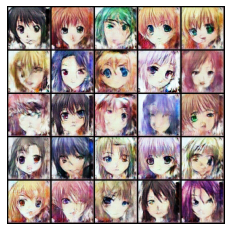

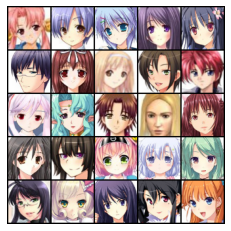

Epoch 18- Step 17500: Generator loss: 0.39156507612764835, discriminator loss: 0.21632484972476954


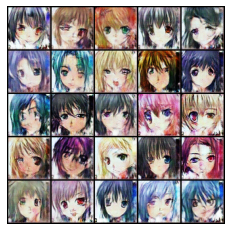

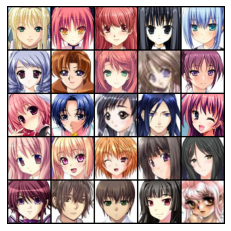

  0%|          | 0/994 [00:00<?, ?it/s]

Epoch 19- Step 18000: Generator loss: 0.3920963496267789, discriminator loss: 0.21672968974709483


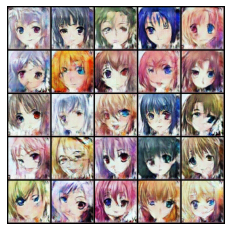

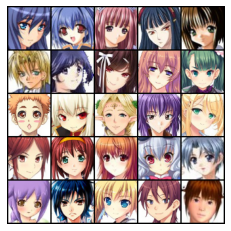

Epoch 19- Step 18500: Generator loss: 0.39535728922486296, discriminator loss: 0.21484166669845592


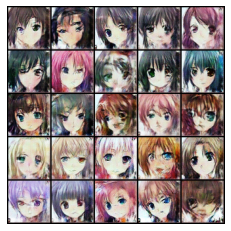

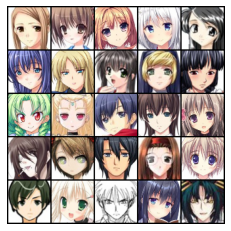

  0%|          | 0/994 [00:00<?, ?it/s]

Epoch 20- Step 19000: Generator loss: 0.3999878018945455, discriminator loss: 0.21421943724155412


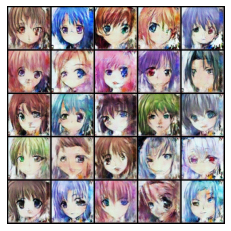

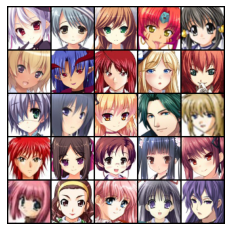

Epoch 20- Step 19500: Generator loss: 0.40564219801127893, discriminator loss: 0.2112073339521886


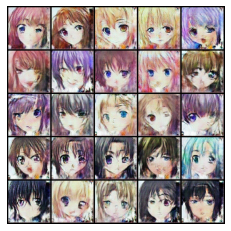

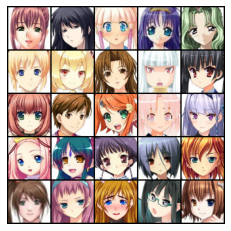

  0%|          | 0/994 [00:00<?, ?it/s]

Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x7f63a008c830>
Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x7f63a008c830>
Traceback (most recent call last):
Traceback (most recent call last):
  File "/usr/local/lib/python3.7/dist-packages/torch/utils/data/dataloader.py", line 1328, in __del__
  File "/usr/local/lib/python3.7/dist-packages/torch/utils/data/dataloader.py", line 1328, in __del__
    self._shutdown_workers()
    self._shutdown_workers()
  File "/usr/local/lib/python3.7/dist-packages/torch/utils/data/dataloader.py", line 1320, in _shutdown_workers
  File "/usr/local/lib/python3.7/dist-packages/torch/utils/data/dataloader.py", line 1320, in _shutdown_workers
    if w.is_alive():
    if w.is_alive():
  File "/usr/lib/python3.7/multiprocessing/process.py", line 151, in is_alive
  File "/usr/lib/python3.7/multiprocessing/process.py", line 151, in is_alive
    assert self._parent_pid == os.getpid(), 'can only test a child

Epoch 21- Step 20000: Generator loss: 0.4023865383416415, discriminator loss: 0.2106700224280358


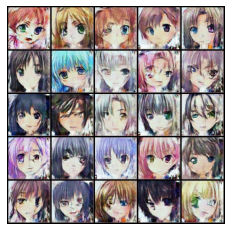

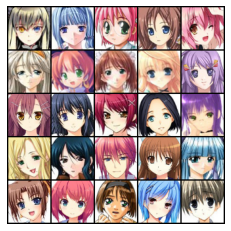

Epoch 21- Step 20500: Generator loss: 0.4084426726102828, discriminator loss: 0.20922727075219155


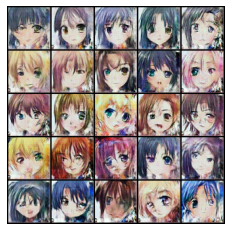

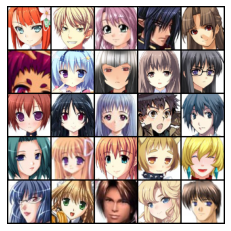

  0%|          | 0/994 [00:00<?, ?it/s]

Epoch 22- Step 21000: Generator loss: 0.41175497783720494, discriminator loss: 0.21013425007462513


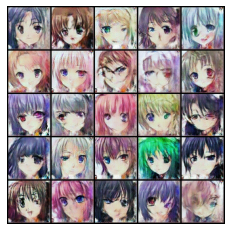

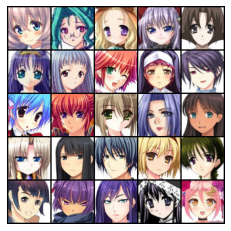

Epoch 22- Step 21500: Generator loss: 0.4139809655398131, discriminator loss: 0.20725424212217297


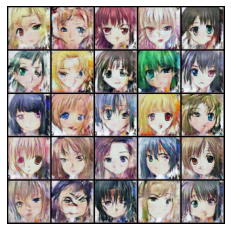

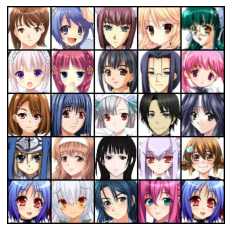

  0%|          | 0/994 [00:00<?, ?it/s]

Epoch 23- Step 22000: Generator loss: 0.41725692458450775, discriminator loss: 0.20665757763385795


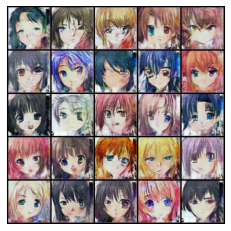

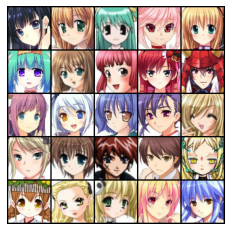

Epoch 23- Step 22500: Generator loss: 0.4224042302817105, discriminator loss: 0.2057602319419385


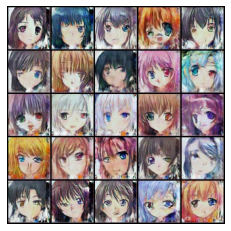

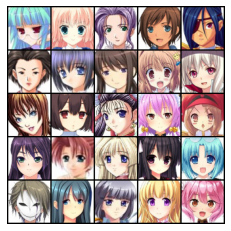

  0%|          | 0/994 [00:00<?, ?it/s]

Epoch 24- Step 23000: Generator loss: 0.42286983449757065, discriminator loss: 0.20407831275463117


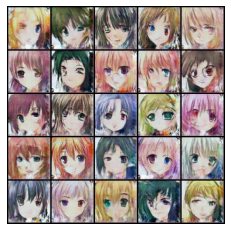

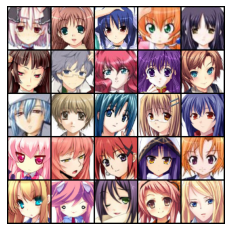

Epoch 24- Step 23500: Generator loss: 0.42938107338547754, discriminator loss: 0.20282313022017462


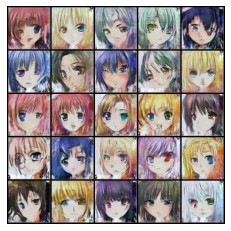

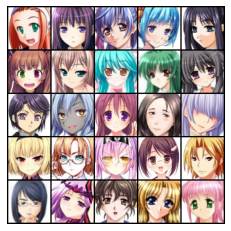

  0%|          | 0/994 [00:00<?, ?it/s]

Epoch 25- Step 24000: Generator loss: 0.4341048255115751, discriminator loss: 0.2028981802463531


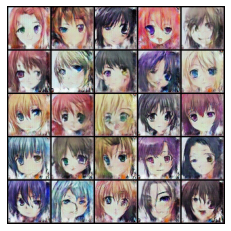

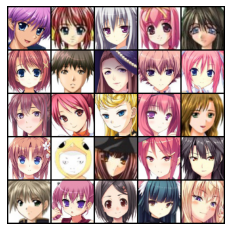

Epoch 25- Step 24500: Generator loss: 0.4310445526540276, discriminator loss: 0.19842558801174148


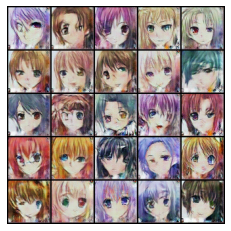

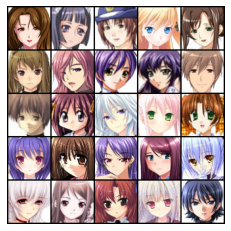

  0%|          | 0/994 [00:00<?, ?it/s]

Epoch 26- Step 25000: Generator loss: 0.43557604503631586, discriminator loss: 0.20032543021440521


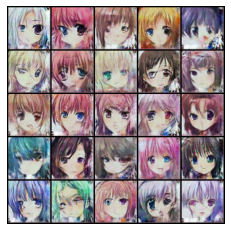

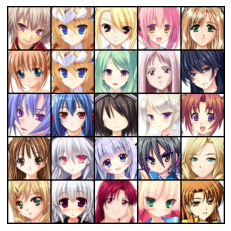

Epoch 26- Step 25500: Generator loss: 0.4366499061584474, discriminator loss: 0.19600554057955724


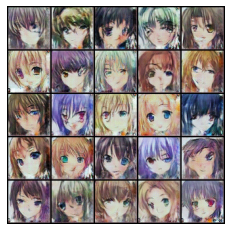

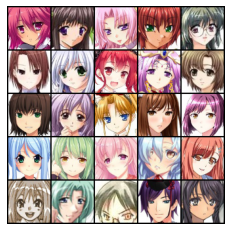

KeyboardInterrupt: ignored

In [12]:
# training
cur_step = 0
mean_discriminator_loss = 0
mean_generator_loss = 0
for epoch in range(n_epochs):
  for real in tqdm(dataloader):
    shape = (len(real),z_dims,1,1)
    real = real.to(device)
    ## check real image
    disc_opt.zero_grad()
    ypred = disc(real)
    real_loss = torch.mean((ypred-torch.ones_like(ypred))**2)
    z = getNoise(shape,device)
    with torch.no_grad():
      fake_images = gen(z)  
    ypred = disc(fake_images)
    #fake_loss = criterion(ypred,torch.zeros_like(ypred))
    fake_loss = torch.mean((ypred-torch.zeros_like(ypred))**2)
    loss = (real_loss+fake_loss)/2
    mean_discriminator_loss += loss.item()/display_step
    loss.backward()
    disc_opt.step()
    gen_opt.zero_grad()
    shape = (5*len(real),z_dims,1,1)
    fake_images = gen(getNoise(shape,device))
    ypred = disc(fake_images)
    #loss_gen = criterion(ypred,torch.ones_like(ypred))
    loss_gen = torch.mean((ypred-torch.ones_like(ypred))**2)
    mean_generator_loss+=loss_gen.item()/display_step
    loss_gen.backward()
    gen_opt.step()

    if cur_step % display_step == 0 and cur_step > 0:
      print(f"Epoch {epoch+1}- Step {cur_step}: Generator loss: {mean_generator_loss}, discriminator loss: {mean_discriminator_loss}")
      show_tensor_images(fake_images)
      show_tensor_images(real)
      mean_generator_loss = 0
      mean_discriminator_loss = 0
      if save_model:
                    torch.save({
                        'disc': disc.state_dict(),
                        'gen': gen.state_dict(),
                        'gen_opt': gen_opt.state_dict(),
                        'disc_A': disc_A.state_dict(),
                        'disc_opt': disc_A_opt.state_dict(),
                    }, f"DCGAN_{cur_step}.pth")
    cur_step += 1

In [ ]:
gen.eval()
from scipy.stats import truncnorm
def truncated_normal(size, threshold=1):
    values = truncnorm.rvs(-threshold, threshold, size=size)
    values = values.astype(np.float32)
    return values
size = [1,z_dims,1,1]
noise = truncated_normal(size,threshold=1)
x = torch.from_numpy(noise).cuda()
#x= getNoise([1, z_dims,1,1],device=device)  
gen_image = gen(x).detach().cpu().numpy()
gen_image = np.transpose(gen_image,axes=(2,3,1,0)).squeeze()
gen_image = (gen_image+1)/2
plt.imshow(gen_image)
plt.axis('off')
None


In [ ]:
rl_image = next(iter(dataloader))[0].cpu().numpy()
rl_image = np.transpose(rl_image,axes=(1,2,0))
rl_image = (rl_image+1)/2
plt.imshow(rl_image)
plt.axis('off')